# **Australia Geospatial Analysis**

**Description about dataset**


1.   Mines - POINT data on the locations of mines in Australia
2.   Ports - POINT data on the locations of ports in Australia
3.   Land Boundry - POLYGON data of states in Australia
4.   Population - POLYGON data with city areas and population density data
5.   Temperature - POINT data with air temperatures in various cities
6.   Vegetation - RASTER data with tree cover height.
7.   Emissions - POINT data on emissions of mines




## Install Libraries

In [ ]:
!pip install rasterio rasterstats  numpy mapclassify

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 9.4 MB/s eta 0:00:00


## Import Libraries

In [ ]:
import geopandas as gpd
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
from scipy.spatial.distance import cdist
import folium
import rasterio
from rasterstats import zonal_stats
import rasterio.plot
import seaborn as sns

## Load Datasets from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load datasets
mines = "/content/drive/MyDrive/gis_files/mines_preprocessed.csv"
ports = "/content/drive/MyDrive/gis_files/ports_preprocessed.csv"
landBorder = "/content/drive/MyDrive/gis_files/State_areas.shx"
population = "/content/drive/MyDrive/gis_files/pp.zip"
temperature = "/content/drive/MyDrive/gis_files/temperature_data.csv"
vegetation = "/content/drive/MyDrive/gis_files/aus_vegetation.tif"
emission = "/content/drive/MyDrive/gis_files/emissions.csv"


vegetation_raster = rasterio.open(vegetation)

mines_df = pd.read_csv(mines)
ports_df = pd.read_csv(ports)
landBorderGpd = gpd.read_file(landBorder, layer='State_areas')
population_gdf = gpd.read_file(population)
temperature_df = pd.read_csv(temperature)
emission_df = pd.read_csv(emission)

mines_gdf = gpd.GeoDataFrame(
    mines_df,
    geometry=gpd.points_from_xy(mines_df.Longitude, mines_df.Latitude),
    crs="EPSG:4326"
)

ports_gdf = gpd.GeoDataFrame(
    ports_df,
    geometry=gpd.points_from_xy(ports_df.longitude, ports_df.latitude),
    crs="EPSG:4326"
)

temperature_gdf = gpd.GeoDataFrame(
    temperature_df,
    geometry=gpd.points_from_xy(temperature_df.x, temperature_df.y),
    crs="EPSG:4326"
)

emission_gdf = gpd.GeoDataFrame(
    emission_df,
    geometry=gpd.points_from_xy(emission_df.longitude, emission_df.latitude),
    crs="EPSG:4326"
)

## Commodity transportation network vizualization

In [ ]:
def create_commodity_network(mines_gdf, ports_gdf):
    G = nx.Graph()

    # Add nodes
    for idx, mine in mines_gdf.iterrows():

        commodities_str = mine['Commodities']

        if isinstance(commodities_str, str) and commodities_str:
            commodities = commodities_str.split(',')
        else:
            commodities = ['sample']


        if mine.geometry.is_valid:
            G.add_node(f"Mine_{idx}",
                       pos=(mine.geometry.x, mine.geometry.y),
                       commodities=commodities)
        else:
            print(f"Warning: Skipping invalid geometry for Mine_{idx}")

    for idx, port in ports_gdf.iterrows():

        commodities_str = port['commodities']

        if isinstance(commodities_str, str) and commodities_str:
            commodities = commodities_str.split(',')
        else:
            commodities = ['sample']


        if port.geometry.is_valid:
            G.add_node(f"Port_{idx}",
                       pos=(port.geometry.x, port.geometry.y),
                       commodities=commodities)
        else:
            print(f"Warning: Skipping invalid geometry for Port_{idx}")

    return G

def connect_network_by_commodity(G, max_distance_km=20):

    mines_projected = mines_gdf.to_crs(epsg=3857)
    ports_projected = ports_gdf.to_crs(epsg=3857)

    for mine_node in [n for n in G.nodes() if n.startswith('Mine')]:
        for port_node in [n for n in G.nodes() if n.startswith('Port')]:

            mine_coords = G.nodes[mine_node]['pos']
            port_coords = G.nodes[port_node]['pos']


            distance = Point(mine_coords).distance(Point(port_coords))

            mine_commodities = G.nodes[mine_node]['commodities']
            port_commodities = G.nodes[port_node]['commodities']
            if (distance < max_distance_km and
                mine_commodities and port_commodities and
                any(comm in port_commodities for comm in mine_commodities)):
                G.add_edge(mine_node, port_node, weight=distance)

    return G

In [ ]:
def visualize_network(G):
    pos = nx.get_node_attributes(G, 'pos')

    plt.figure(figsize=(20,20))
    nx.draw_networkx_nodes(G, pos,
                            node_color=['red' if n.startswith('Mine') else 'blue' for n in G.nodes()],
                            node_size=50)
    nx.draw_networkx_edges(G, pos, alpha=0.2)
    plt.title('Commodity Transportation Network')
    landBorderGpd.plot(ax=plt.gca(), alpha=0.5, color='green')
    plt.show()

In [ ]:
import networkx as nx
from ipywidgets import interact, IntSlider

def network_analysis(G):
    print(f"Total Nodes: {G.number_of_nodes()}")
    print(f"Total Edges: {G.number_of_edges()}")

    components = list(nx.connected_components(G))
    total_components = len(components)
    print(f"\nTotal Connected Components: {total_components}\n")

    def display_components(limit):
        print(f"Showing first {limit} components:\n")
        for i, component in enumerate(components[:limit]):
            print(f"Component {i+1} (Size: {len(component)}): {sorted(component)}\n")
        if limit < total_components:
            print(f"... Showing {limit} of {total_components} components.")
        else:
            print(f"Showing all {total_components} components.")

    interact(display_components, limit=IntSlider(min=1, max=len(components), step=1, value=5))

def shortest_path_analysis(G):

    shortest_paths = {}
    for mine_node in [n for n in G.nodes() if n.startswith('Mine')]:
        for port_node in [n for n in G.nodes() if n.startswith('Port')]:
            try:
                path = nx.shortest_path(G, mine_node, port_node, weight='weight')
                shortest_paths[(mine_node, port_node)] = path
            except nx.NetworkXNoPath:
                pass

    return shortest_paths

In [ ]:
def compute_commodity_transportation_network():
    commodity_network = create_commodity_network(mines_gdf, ports_gdf)

    connected_network = connect_network_by_commodity(commodity_network)

    visualize_network(connected_network)

    network_metrics = network_analysis(connected_network)
    shortest_paths = shortest_path_analysis(connected_network)

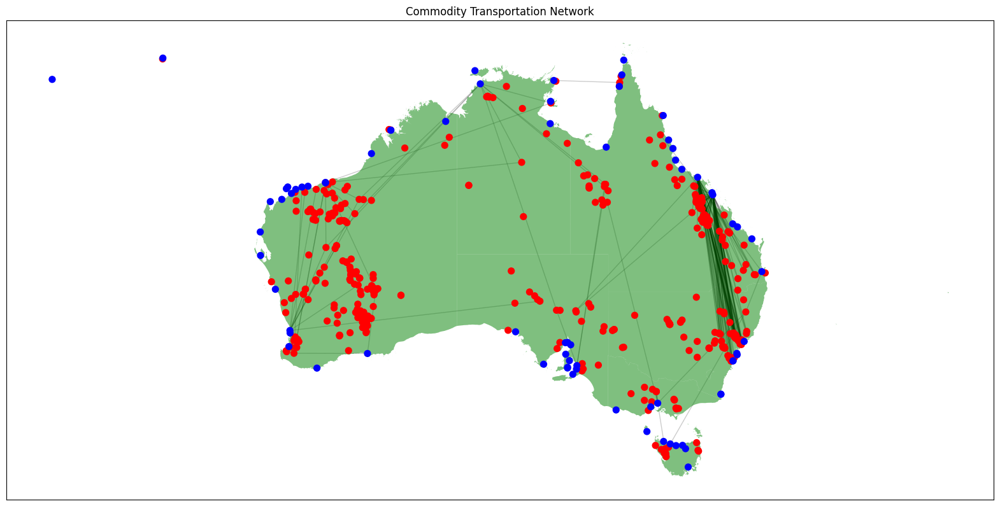

Total Nodes: 493
Total Edges: 264

Total Connected Components: 345



interactive(children=(IntSlider(value=5, description='limit', max=345, min=1), Output()), _dom_classes=('widge…

In [ ]:
compute_commodity_transportation_network()

# Commodity wise analysis

### Mines according to commodities

In [ ]:
aus_mine_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=5)

In [ ]:
filtered_mines_gdf = mines_gdf[mines_gdf['Commodities'].str.contains('Gold|Iron|Iron Ore', na=False)]

commodity_color_map = {
     'Gold': 'orange',
     'Iron': 'black',
     'Iron Ore': 'black'
}

for idx, row in filtered_mines_gdf.iterrows():
     commodity = row['Commodities'].split(',')[0]
     color = commodity_color_map.get(commodity, 'blue')
     folium.Marker(
         location=[row['Latitude'], row['Longitude']],
         popup=f"Commodity: {row['Commodities']}",
         icon=folium.Icon(color=color, icon='info-sign'),
     ).add_to(aus_mine_map)

*   Gold - orange
*   Iron - Black
*   Other - blue

In [ ]:
aus_mine_map

### Ports according to commodities

In [ ]:
aus_port_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=5)

In [ ]:
filtered_mines_gdf = ports_gdf[ports_gdf['commodities'].str.contains('Coal|Iron|Iron Ore', na=False)]

commodity_color_map = {
     'Coal': 'black',
     'Iron': 'red',
     'Iron Ore': 'red'
}

for idx, row in filtered_mines_gdf.iterrows():
     commodity = row['commodities'].split(',')[0]
     color = commodity_color_map.get(commodity, 'blue')
     folium.Marker(
         location=[row['latitude'], row['longitude']],
         popup=f"Commodity: {row['commodities']}",
         icon=folium.Icon(color=color, icon='info-sign')
     ).add_to(aus_port_map)



*   Coal: black
*   Iron: red
*   Iron Ore: red

In [ ]:
aus_port_map

### Ports Located within a Specified Buffer Zone Surrounding a Mine, Irrespective of Commodity Type

In [ ]:
longitude = 116.358100
latitude = -32.750900
mine_location = Point(longitude, latitude)

ports_data = ports_gdf.to_crs(epsg=4326)
mines_data = mines_gdf.to_crs(epsg=4326)


buffer_zone = mine_location.buffer(1)

buffer_gdf = gpd.GeoDataFrame(geometry=[buffer_zone], crs='epsg:4326')

m = folium.Map(location=[latitude, longitude], zoom_start=8)

folium.GeoJson(
    buffer_gdf.to_json(),
    name="Buffer Zone",
    style_function=lambda x: {'color': 'green', 'weight': 1, 'fillOpacity': 0.2}
).add_to(m)


for idx, row in ports_data.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
    ).add_to(m)


folium.Marker(
    location=[mine_location.y, mine_location.x],
    icon=folium.Icon(icon='glyphicon glyphicon-info-sign', color='red'),
).add_to(m)


folium.LayerControl().add_to(m)

m

In [ ]:
emission_gdf.head()

,report_year,facility_id,jurisdiction_code,facility_name,state,latitude,longitude,sum(total_emission_kg),geometry
0,2015/2016,483266.0,NSW,Endeavor Mine,NSW,-31.2,145.7,223577.5,POINT (145.7 -31.2)
1,2015/2016,483476.0,NSW,Martins Creek Quarry Daracon,NSW,-32.6,151.6,76784.8,POINT (151.6 -32.6)
2,2015/2016,483574.0,NSW,Lidsdale Coal Loading Facility,NSW,-33.4,150.1,3.0,POINT (150.1 -33.4)
3,2015/2016,483670.0,NSW,Boral Recycling Widemere,NSW,-33.8,150.9,55226.2,POINT (150.9 -33.8)
4,2015/2016,483680.0,NSW,Boral Seaham Quarry,NSW,-32.7,151.8,97604.0,POINT (151.8 -32.7)


In [ ]:
ports_gdf.head()

,commodities,class,state,longitude,latitude,geometry
0,Coal,Commodity,Queensland,148.08333,-19.88333,POINT (148.08333 -19.88333)
1,Silica Sands,Commodity,Western Australia,117.88924,-35.03078,POINT (117.88924 -35.03078)
2,Iron Ore,Commodity,South Australia,137.91678,-34.43709,POINT (137.91678 -34.43709)
3,"Ammonia, Iron Ore, Liquid Natural Gas, Salt",Commodity,Western Australia,115.86545,-21.16665,POINT (115.86545 -21.16665)
4,Iron Ore,Commodity,Western Australia,115.46379,-20.78951,POINT (115.46379 -20.78951)


In [ ]:
mines_gdf.head()

,Commodities,Name,State,Longitude,Latitude,geometry
0,Jade,Cowell,SA,136.937848,-33.479777,POINT (136.93785 -33.47978)
1,"Uranium, Uranium oxide",Beverley,SA,139.605105,-30.190409,POINT (139.60511 -30.19041)
2,"Gold, Copper",Boddington,WA,116.358100,-32.750900,POINT (116.3581 -32.7509)
3,"Zinc, Copper, Lead, Silver, Gold",Dry River South,QLD,144.689000,-18.790400,POINT (144.689 -18.7904)
4,Diamond - undifferentiated,Ellendale,WA,124.858036,-17.563222,POINT (124.85804 -17.56322)


### Ports Located within a Specified Buffer Zone Surrounding a Mine, Specific to Commodity Type

In [ ]:
longitude = 116.3581
latitude = -32.7509
mine_location = Point(longitude, latitude)

specific_commodity = 'Iron Ore'

ports_data = ports_gdf.to_crs(epsg=4326)
mines_data = mines_gdf.to_crs(epsg=4326)


buffer_zone = mine_location.buffer(10)
buffer_gdf = gpd.GeoDataFrame(geometry=[buffer_zone], crs='epsg:4326')


m = folium.Map(location=[latitude, longitude], zoom_start=8)


folium.GeoJson(
    buffer_gdf.to_json(),
    name="Buffer Zone",
    style_function=lambda x: {'color': 'green', 'weight': 1, 'fillOpacity': 0.2}
).add_to(m)


filtered_ports = ports_data[ports_data['commodities'] == specific_commodity]
filtered_ports = filtered_ports[filtered_ports.geometry.within(buffer_zone)]


for idx, row in filtered_ports.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"Commodity: {row['commodities']}"
    ).add_to(m)


folium.Marker(
    location=[mine_location.y, mine_location.x],
    icon=folium.Icon(icon='glyphicon glyphicon-info-sign', color='red'),
).add_to(m)


folium.LayerControl().add_to(m)

m

# Vegetation and Population

In [ ]:
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd

population_data = population_gdf.to_crs(vegetation_raster.crs)

zonal_statistics = zonal_stats(
    population_data,
    vegetation_raster.read(1),
    affine=vegetation_raster.transform,
    stats=["mean"]
)
population_data["veg_mean"] = [stat["mean"] for stat in zonal_statistics]

m = folium.Map(location=[-25.0, 133.0], zoom_start=5, tiles="cartodb positron")

for _, row in population_data.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, veg=row['veg_mean']: {
            'fillColor': 'green' if veg is None else f'#{int(255 - veg * 10):02x}ff7f',
            'color': 'black',
            'weight': 0.5,
            'fillOpacity': 0.6
        },
        tooltip=f"Veg Mean: {row['veg_mean']}"
    ).add_to(m)

for _, row in mines_gdf.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Mine: {row['Commodities']}",
        icon=folium.Icon(color='blue', icon='triangle-exclamation', prefix='fa')
    ).add_to(m)

for _, row in ports_gdf.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Port: {row['commodities']}",
        icon=folium.Icon(color='green', icon='square', prefix='fa')
    ).add_to(m)

temperature_cluster = MarkerCluster().add_to(m)
for _, row in temperature_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        popup=f"Temperature: {row['tair']}"
    ).add_to(temperature_cluster)

m

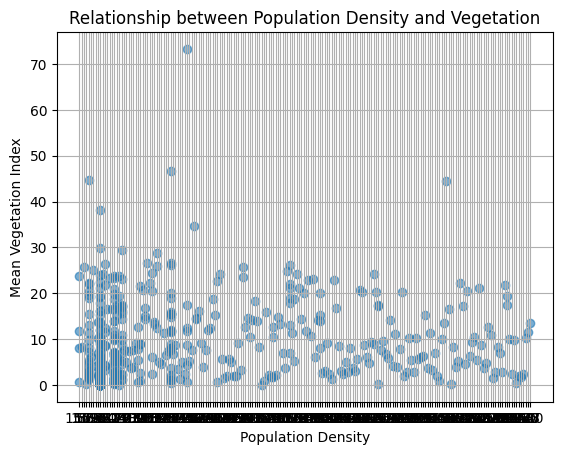

In [ ]:
plt.scatter(population_data["density"], population_data["veg_mean"], alpha=0.6)
plt.xlabel("Population Density")
plt.ylabel("Mean Vegetation Index")
plt.title("Relationship between Population Density and Vegetation")
plt.grid()
plt.show()


In [ ]:
correlation = population_data[["density", "veg_mean"]].corr()
print(correlation)


           density  veg_mean
density   1.000000 -0.053929
veg_mean -0.053929  1.000000


# Emission Data from mines and their impact

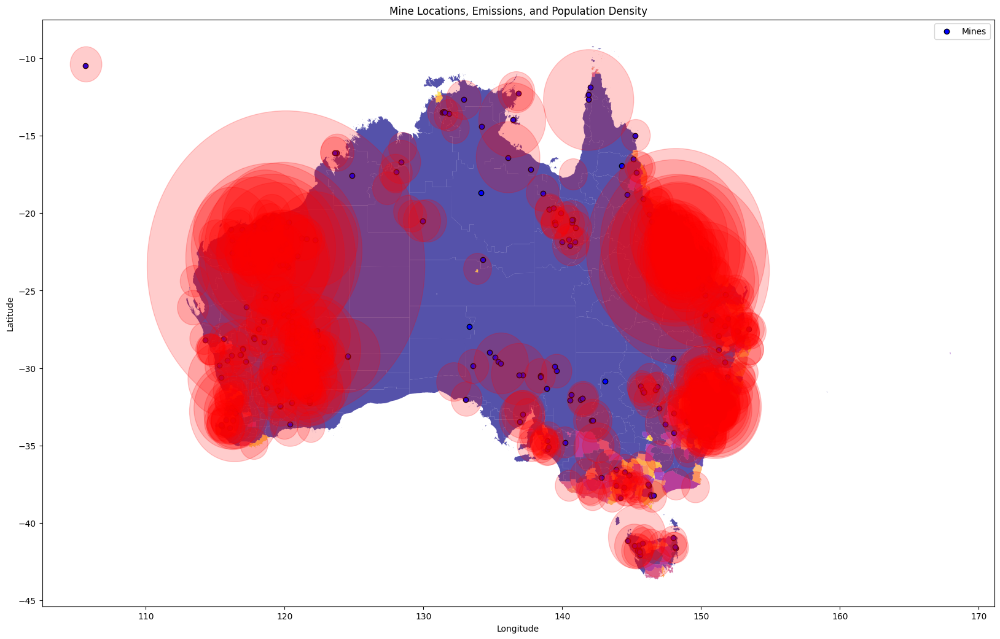

In [ ]:
emission_gdf['normalized_emission'] = (emission_gdf['sum(total_emission_kg)'] - emission_gdf['sum(total_emission_kg)'].min()) / (emission_gdf['sum(total_emission_kg)'].max() - emission_gdf['sum(total_emission_kg)'].min())
emission_gdf['normalized_emission'] = emission_gdf['normalized_emission'] * 9 + 1  # Scale to 1-10

fig, ax = plt.subplots(figsize=(20, 20))


population_gdf.plot(ax=ax, column='density', cmap='plasma', alpha=0.7, legend=True)

ax.scatter(mines_gdf['Longitude'], mines_gdf['Latitude'], marker='o', color='blue', label='Mines', edgecolor='black', zorder=2)


for idx, row in emission_gdf.iterrows():
    circle = plt.Circle((row['longitude'], row['latitude']), radius=row['normalized_emission'],
                       color='red', alpha=0.2, zorder=3)
    ax.add_artist(circle)


ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Mine Locations, Emissions, and Population Density")
ax.legend()

plt.show()

In [ ]:
aus_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=5)

ports_layer = folium.FeatureGroup(name="Ports").add_to(aus_map)
for idx, row in ports_gdf.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Port exports: {row['commodities']}",
        icon=folium.Icon(color="blue")
    ).add_to(ports_layer)


mines_layer = folium.FeatureGroup(name="Mines").add_to(aus_map)
for idx, row in mines_gdf.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Mine: {row['Commodities']}",
        icon=folium.Icon(color="green")
    ).add_to(mines_layer)

emission_gdf['normalized_emission'] = (emission_gdf['sum(total_emission_kg)'] - emission_gdf['sum(total_emission_kg)'].min()) / (emission_gdf['sum(total_emission_kg)'].max() - emission_gdf['sum(total_emission_kg)'].min())
emission_gdf['normalized_emission'] = emission_gdf['normalized_emission'] * 9 + 1  # Scale to 1-10


emissions_layer = folium.FeatureGroup(name="Emissions").add_to(aus_map)
for idx, row in emission_gdf.iterrows():
    folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=row["normalized_emission"]* 10000,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        popup=f"Emission Value: {row['sum(total_emission_kg)']}"
    ).add_to(emissions_layer)

folium.LayerControl().add_to(aus_map)

aus_map

In [ ]:
population_data.head()

,primaryinde,state_code_,state_name_,lga_code_20,lga_name_20,year,population,area,density,population_,...,natural_inc,internal_ar,internal_de,net_interna,overseas_ar,overseas_de,net_oversea,joint_regio,other_group,geometry
0,5.0,1.0,New South Wales,10470,Bathurst Regional,2019,43612,3817.864502,11,None,...,204,2623,2532,91,289,135,154,Central NSW,None,"POLYGON ((1644426.902 -3772373.956, 1643535.63..."
1,10.0,1.0,New South Wales,10750,Blacktown,2019,374372,240.048706,1559,None,...,4335,24615,24925,-310,8185,3916,4269,Western Sydney,None,"POLYGON ((1725669.369 -3818216.331, 1725913.19..."
2,13.0,1.0,New South Wales,10900,Blue Mountains,2019,79108,1431.144165,55,None,...,92,4267,4816,-549,706,332,374,Western Sydney,The Parks,"POLYGON ((1713872.559 -3801039.955, 1713830.07..."
3,17.0,1.0,New South Wales,11250,Broken Hill,2019,17477,170.115295,102,None,...,-8,787,1052,-265,65,30,35,Far South West,None,"POLYGON ((883243.675 -3520264.41, 880661.229 -..."
4,20.0,1.0,New South Wales,11400,Cabonne,2019,13632,6022.349609,2,None,...,21,952,1029,-77,39,18,21,Central NSW,None,"POLYGON ((1601390.23 -3714473.954, 1601422.104..."


In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))

population_data.plot(ax=ax, column='veg_mean', cmap='Greens', alpha=1, legend=True, legend_kwds={'orientation': 'horizontal'})

for idx, row in emission_gdf.iterrows():
    circle = plt.Circle((row['longitude'], row['latitude']), radius=row['normalized_emission'],
                       color='red', alpha=0.2, zorder=3)
    ax.add_artist(circle)

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Emissions and Vegetation")
ax.legend()

plt.show()

## Emission and Vegetation


In [ ]:
emission_gdf = emission_gdf.to_crs(epsg=4326)
population_gdf = population_data.to_crs(epsg=4326)

combined_gdf = gpd.sjoin(emission_gdf, population_gdf, how="inner", predicate="intersects")

combined_gdf = combined_gdf.dropna(subset=['sum(total_emission_kg)', 'veg_mean'])

correlation = combined_gdf[['sum(total_emission_kg)', 'veg_mean']].corr()

print("Correlation between Emissions and Vegetation:")
print(correlation)

Correlation between Emissions and Vegetation:
                        sum(total_emission_kg)  veg_mean
sum(total_emission_kg)                1.000000 -0.158384
veg_mean                             -0.158384  1.000000


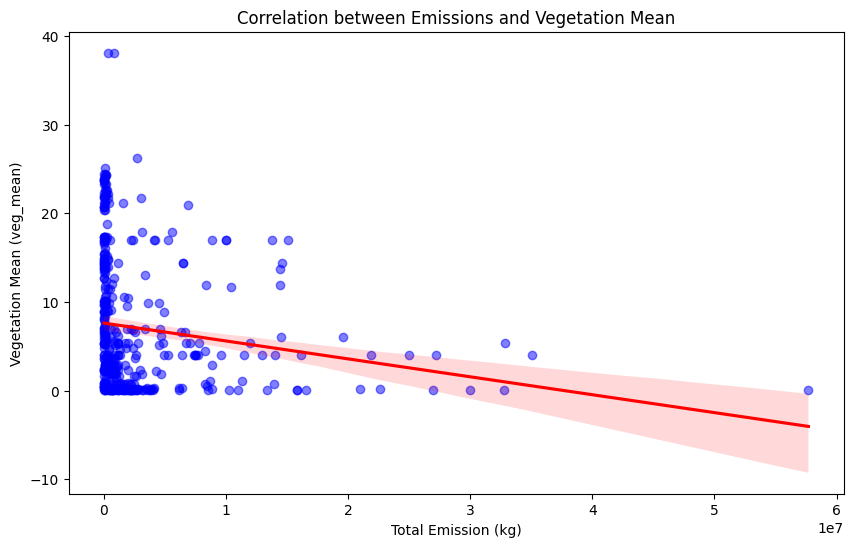

In [ ]:
emission_gdf_cleaned = combined_gdf.dropna(subset=['sum(total_emission_kg)', 'veg_mean'])

plt.figure(figsize=(10, 6))
sns.regplot(
    x='sum(total_emission_kg)',
    y='veg_mean',
    data=emission_gdf_cleaned,
    scatter_kws={'color': 'blue', 'alpha': 0.5},
    line_kws={'color': 'red'}
)

plt.title("Correlation between Emissions and Vegetation Mean")
plt.xlabel("Total Emission (kg)")
plt.ylabel("Vegetation Mean (veg_mean)")
plt.show()

The correlation coefficient between emissions and vegetation mean is -0.158384.

A correlation value of -0.15 indicates a *weak negative* relationship between emissions and vegetation.
As emissions increase, vegetation levels tend to slightly decrease, but the relationship is not strong.

Possible Explanation:

While there is a slight negative trend, emissions alone are not the dominant factor influencing vegetation mean. Other factors, such as climate, land use, or soil quality, likely play a significant role in determining vegetation levels.

## Emission and Ports


In [ ]:
from geopy.distance import geodesic
import pandas as pd

def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).kilometers

emission_coords = emission_gdf[['latitude', 'longitude']].values

def find_closest_emission(row):
    port_lat, port_lon = row['latitude'], row['longitude']
    distances = [calculate_distance(port_lat, port_lon, em_lat, em_lon) for em_lat, em_lon in emission_coords]
    min_distance = min(distances)
    closest_emission = emission_gdf.iloc[distances.index(min_distance)]
    return pd.Series({
        'min_distance_to_emission': min_distance,
        'sum(total_emission_kg)': closest_emission['sum(total_emission_kg)']
    })

ports_emission_df = ports_gdf.apply(find_closest_emission, axis=1)


print(ports_emission_df.head())

   min_distance_to_emission  sum(total_emission_kg)
0                 68.432571                586325.7
1                 16.641073                 15406.9
2                  4.394059                  1665.6
3                 35.527151              11332874.0
4                 83.934488              11332874.0


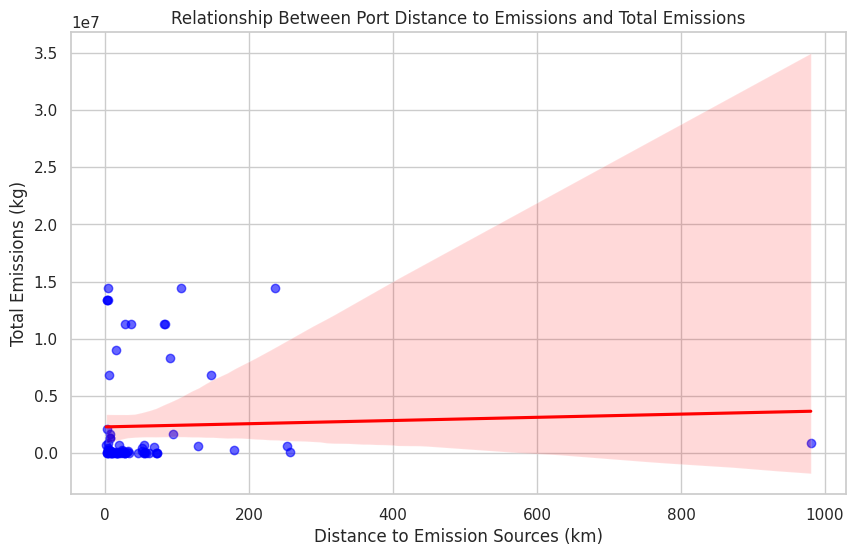

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

sns.regplot(
    x="min_distance_to_emission",
    y="sum(total_emission_kg)",
    data=ports_emission_df,
    scatter_kws={"color": "blue", "alpha": 0.6},
    line_kws={"color": "red"},
)

plt.title("Relationship Between Port Distance to Emissions and Total Emissions")
plt.xlabel("Distance to Emission Sources (km)")
plt.ylabel("Total Emissions (kg)")
plt.show()

The value of 0.03757 is very close to 0, suggesting that there is a very weak positive relationship between the distance from emissions and the total emissions.

Possible Explanation:

This could indicate that emissions are influenced more by other factors, such as local industries, mining activities, or infrastructure, rather than just geographical distance from emission sources.

## Emission and Population

In [ ]:
import geopandas as gpd

emission_gdf = gpd.GeoDataFrame(emission_gdf, geometry=gpd.points_from_xy(emission_gdf['longitude'], emission_gdf['latitude']))
population_gdf = gpd.GeoDataFrame(population_gdf)

emission_population_df = gpd.sjoin(emission_gdf, population_gdf, how="inner", predicate="within")
emission_population_df = emission_population_df.dropna(subset=['population', 'sum(total_emission_kg)'])

emission_population_df['population'] = pd.to_numeric(emission_population_df['population'], errors='coerce')
emission_population_df['sum(total_emission_kg)'] = pd.to_numeric(emission_population_df['sum(total_emission_kg)'], errors='coerce')

correlation = emission_population_df[['sum(total_emission_kg)', 'population']].corr()

print("Correlation between Emissions and Population:")
print(correlation)

Correlation between Emissions and Population:
                        sum(total_emission_kg)  population
sum(total_emission_kg)                1.000000   -0.116527
population                           -0.116527    1.000000


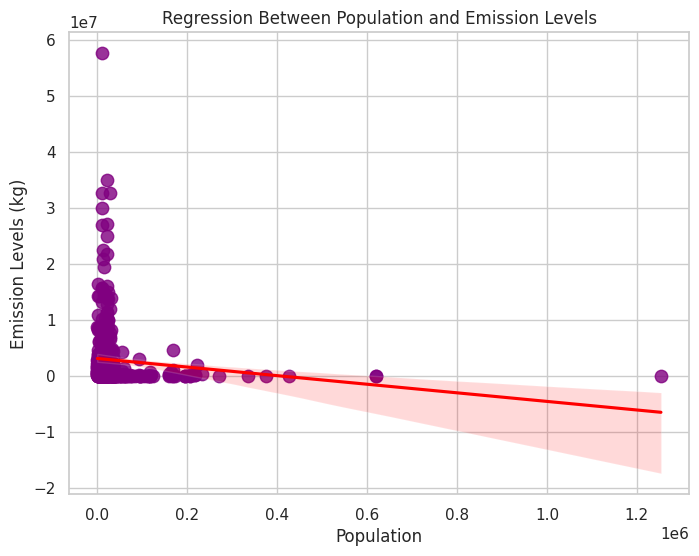

In [ ]:
plt.figure(figsize=(8, 6))
sns.regplot(
    x='population',
    y='sum(total_emission_kg)',
    data=emission_population_df,
    scatter_kws={'color': 'purple', 's': 80},
    line_kws={'color': 'red'}
)
plt.xlabel("Population")
plt.ylabel("Emission Levels (kg)")
plt.title("Regression Between Population and Emission Levels")
plt.grid(True)
plt.show()

Negative Correlation: The value -0.116 indicates a weak negative correlation between emissions and population.

 Since the correlation is close to 0, there is little to no linear relationship between emissions and population. Other factors, such as industry, geography, or economic activity, might be more influential in driving emissions.

# Weather and population combined

## Weather station locations in Australia compared to Mines and Ports

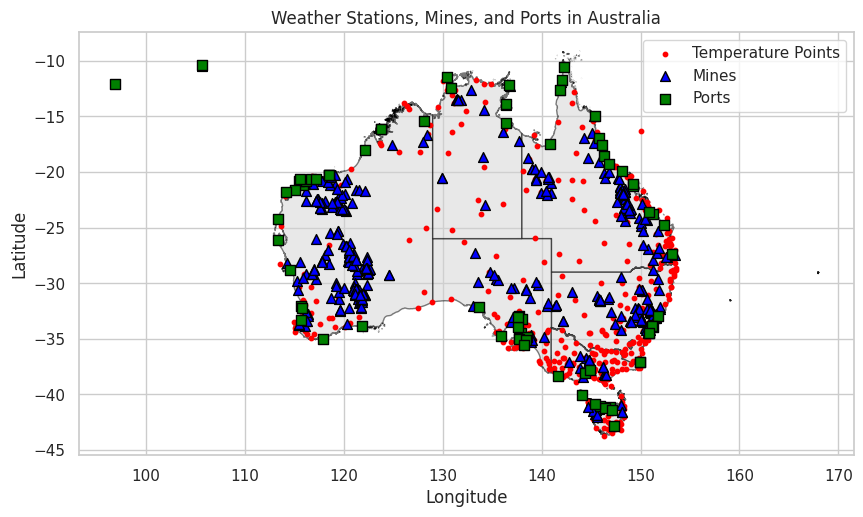

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))

landBorderGpd.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

temperature_gdf.plot(ax=ax, markersize=10, color='red', marker='o', label='Weather Stations')

ax.scatter(mines_gdf['Longitude'], mines_gdf['Latitude'],
           color='blue', marker='^', s=50, label='Mines', edgecolor='black', zorder=2)

ax.scatter(ports_gdf['longitude'], ports_gdf['latitude'],
           color='green', marker='s', s=50, label='Ports', edgecolor='black', zorder=3)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Weather Stations, Mines, and Ports in Australia")
plt.legend()

plt.show()

## Temperature leveles identify by each weather station

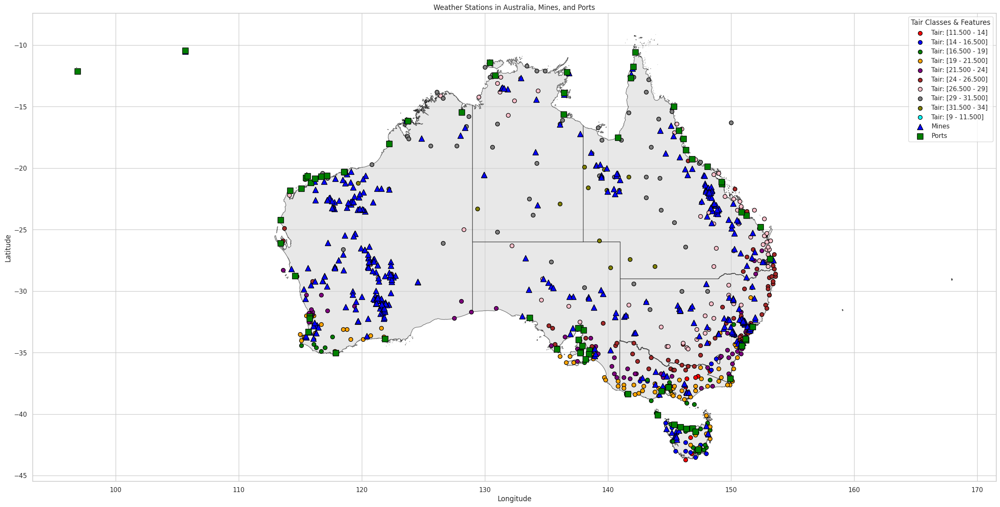

In [ ]:
fig, ax = plt.subplots(figsize=(30, 25))

landBorderGpd.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

unique_classes = sorted(temperature_gdf['tair'].unique())

colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

color_map = {cls: colors[i % len(colors)] for i, cls in enumerate(unique_classes)}

for cls, color in color_map.items():
    class_data = temperature_gdf[temperature_gdf['tair'] == cls]
    ax.scatter(class_data.geometry.x, class_data.geometry.y,
               color=color, label=f'Tair: {cls}', s=50, edgecolor='black', zorder=3)

ax.scatter(mines_gdf['Longitude'], mines_gdf['Latitude'],
           color='blue', marker='^', s=100, label='Mines', edgecolor='black', zorder=4)

ax.scatter(ports_gdf['longitude'], ports_gdf['latitude'],
           color='green', marker='s', s=100, label='Ports', edgecolor='black', zorder=5)

plt.legend(title='Tair Classes & Features', loc='upper right')

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Weather Stations in Australia, Mines, and Ports")
plt.grid(True)

plt.show()

In [ ]:
population_gdf['population'] = population_gdf['population'].fillna(0).astype(float)
population_gdf['area'] = population_gdf['area'].fillna(0).astype(float)

In [ ]:
population_gdf['population'] = (population_gdf['population'] - population_gdf['population'].min()) / (population_gdf['population'].max() - population_gdf['population'].min())

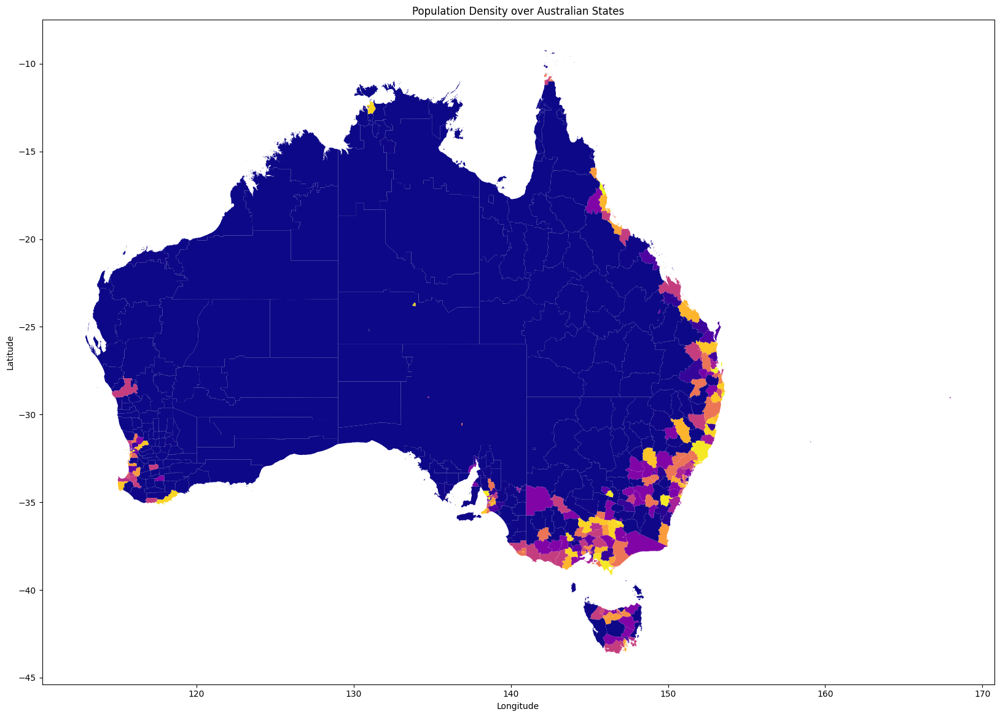

In [ ]:
population_gdf.to_crs(epsg=4326, inplace=True)

fig, ax = plt.subplots(figsize=(20, 20))

population_gdf.plot(ax=ax, column='density', cmap='plasma', legend=False)

plt.title("Population Density over Australian States")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.show()

In [ ]:
aus_map = folium.Map(location=[-25.2744, 133.7751], zoom_start=4)

folium.Choropleth(
    geo_data=population_gdf.to_json(),
    name="Population Density",
    data=population_gdf,
    columns=["state_name_", "population"],
    key_on="feature.properties.state_name_",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Population Density",
).add_to(aus_map)

folium.LayerControl().add_to(aus_map)

aus_map